## tracking the detected pupil



In [3]:
%load_ext autoreload
%autoreload 2
import numpy as np
np.set_printoptions(precision=2, suppress=True)
# define plots to be inserted interactively
import matplotlib.pyplot as plt
%matplotlib inline
import cv2

/usr/local/lib/python3.5/site-packages/matplotlib/__init__.py:872: UserWarning: axes.color_cycle is deprecated and replaced with axes.prop_cycle; please use the latter.
  warnings.warn(self.msg_depr % (key, alt_key))


### Using 42 frames recorded with 2015-11-05 notebook


In [4]:
import cv2
import os

N_frame = 42

folder = '/tmp/debug'
img0 = cv2.imread(os.path.join(folder, 'frame_1.png'))
H, W, three = img0.shape

movie = np.zeros((H, W, 3, N_frame), dtype=np.uint8)

for i in range(N_frame):
    fname = 'frame_{i}.png'.format(i=i)
    movie[:, :, :, i] = cv2.imread(os.path.join(folder, fname))


(720, 1280, 3, 42) 0 255


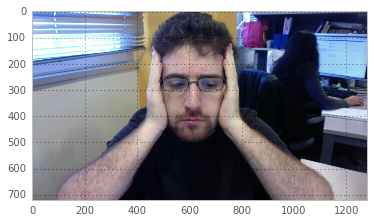

In [5]:
print(movie.shape, movie.min(), movie.max())
plt.imshow(img0)

In [6]:
import cv2

face_cascade = cv2.CascadeClassifier('/usr/local/Cellar/opencv3/3.1.0_1/share/OpenCV/haarcascades/haarcascade_frontalface_default.xml')
eye_cascade = cv2.CascadeClassifier('/usr/local/Cellar/opencv3/3.1.0_1/share/OpenCV/haarcascades/haarcascade_eye.xml')
lefteye_cascade = cv2.CascadeClassifier('/usr/local/Cellar/opencv3/3.1.0_1/share/OpenCV/haarcascades/haarcascade_lefteye_2splits.xml')
righteye_cascade = cv2.CascadeClassifier('/usr/local/Cellar/opencv3/3.1.0_1/share/OpenCV/haarcascades/haarcascade_righteye_2splits.xml')

def get_just_one(image, cascade):
    # We set set minNeighbors=1 then increase it until we have one face only - same for eyes see http://stackoverflow.com/questions/22249579/opencv-detectmultiscale-minneighbors-parameter
    features, minNeighbors = [], 1
    while len(features) == 0 and minNeighbors<20:
        features = cascade.detectMultiScale(image, 1.1, minNeighbors) # image[, scaleFactor[, minNeighbors[, flags[, minSize[, maxSize]
        minNeighbors += 1
        #print(minNeighbors)
    return features[0], minNeighbors

img_ = img0.copy()
img_ = cv2.cvtColor(img_, cv2.COLOR_RGB2GRAY)

out = img0.copy()
(x,y,w,h), minNeighbors = get_just_one(img_, face_cascade)
print('size of head (pixels) = ', h, w)

#half_w, quarter_w = w//2, w//4
#roi_color = img_[(y+quarter_w):(y+quarter_w+half_w), x:x+w]
#out_color = out[(y+quarter_w):(y+quarter_w+half_w), x:x+w]

roi_color = img_[y:y+h, x:x+w]
out_color = out[y:y+h, x:x+w]
(lex, ley, lew, leh), minNeighbors = get_just_one(roi_color, lefteye_cascade)
(rex, rey, rew, reh), minNeighbors = get_just_one(roi_color, righteye_cascade)


left_eye_movie = np.zeros((leh, lew, 3, N_frame), dtype=np.uint8)
right_eye_movie = np.zeros((reh, rew, 3, N_frame), dtype=np.uint8)
for i in range(N_frame):
    out_color = movie[y:y+h, x:x+w, :, i]
    left_eye_movie[:, :, :, i] = out_color[ley:ley+leh, lex:lex+lew]
    right_eye_movie[:, :, :, i] = out_color[rey:rey+reh, rex:rex+rew]


size of head (pixels) =  346 346



##  segmenting using dynamics

- the eyebrow on upper quarter 
- the skin is all around
- the reflection is white and small
- the iris is round, darker


In [7]:
masks = []
movies =  [right_eye_movie, left_eye_movie]

for i, eye_movie in enumerate(movies):
    eye_movie_b = np.zeros_like(eye_movie)
    for i in range(N_frame):
        eye_movie_b[:, :, :, i] = cv2.medianBlur(eye_movie[:, :, :, i], 7)

    #print(eye_movie.min(), eye_movie.max(), type(eye_movie))
    eye_movie_b = eye_movie_b.astype(np.float)
    std_eye = eye_movie_b.std(axis=-1).mean(axis=-1)
    #print(std_eye.min(), std_eye.max(), type(std_eye))
    std_eye /= std_eye.max()
    #print(std_eye.min(), std_eye.max(), type(std_eye))
    std_eye *= 255
    #print(std_eye.min(), std_eye.max(), type(std_eye))
    std_eye = std_eye.astype(np.uint8)
    #print(std_eye.min(), std_eye.max(), type(std_eye))
    ret_skin, skin_mask = cv2.threshold(std_eye, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    # to make sure the eyebrows are removed
    skin_mask[:skin_mask.shape[0]//3, :] = 0
    kernel = np.ones((7, 7))
    for ii_ in range(3):
        skin_mask = cv2.morphologyEx(skin_mask, cv2.MORPH_CLOSE, kernel)   
        skin_mask = cv2.morphologyEx(skin_mask, cv2.MORPH_OPEN, kernel)    
    #print(skin_mask.min(), skin_mask.max(), type(skin_mask))

    # threshold and binary AND
    skin_mask = cv2.merge((skin_mask,skin_mask,skin_mask))
    #print(skin_mask.min(), skin_mask.max(), skin_mask.shape, type(skin_mask))
    masks.append(skin_mask)

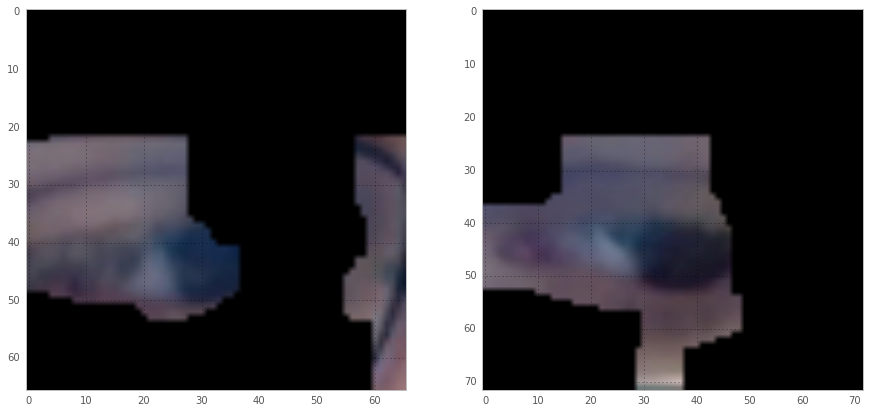

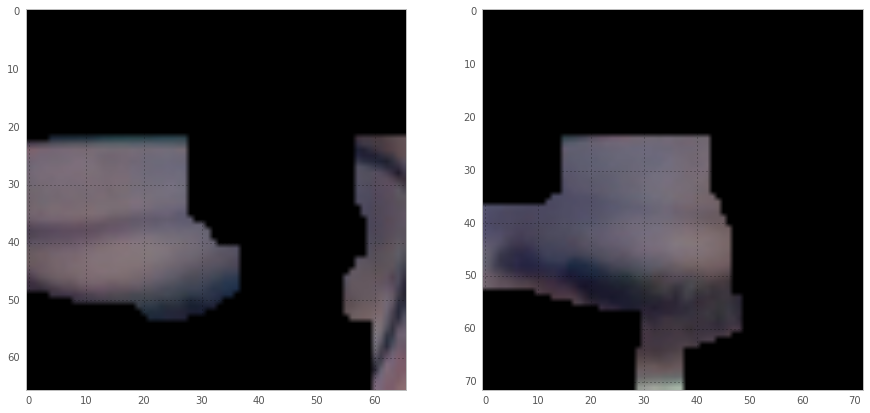

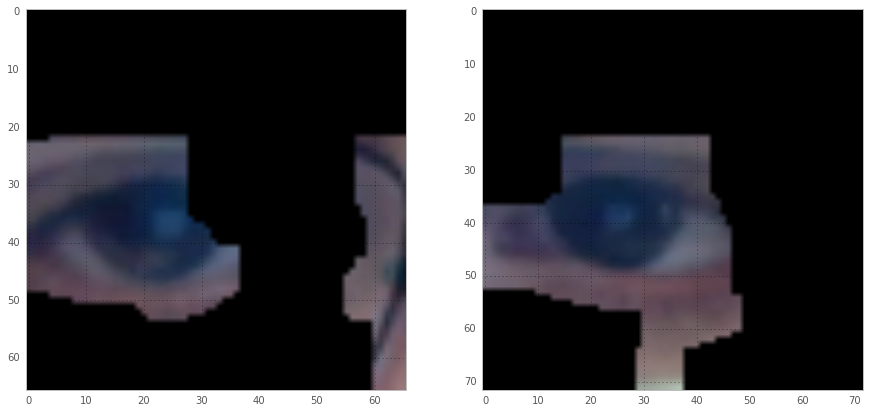

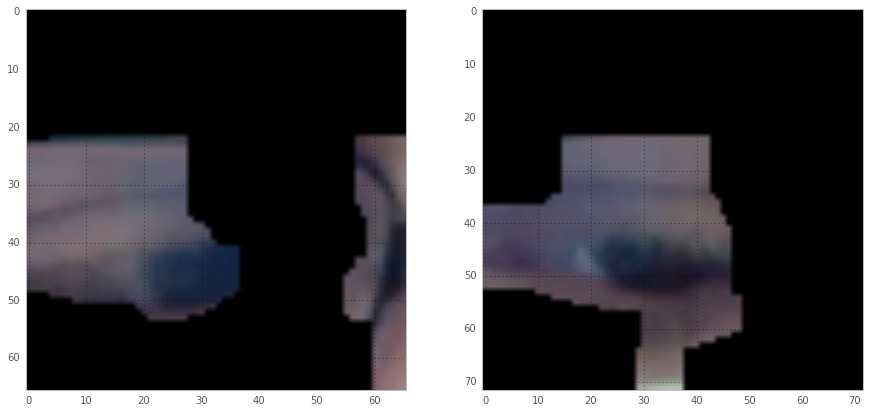

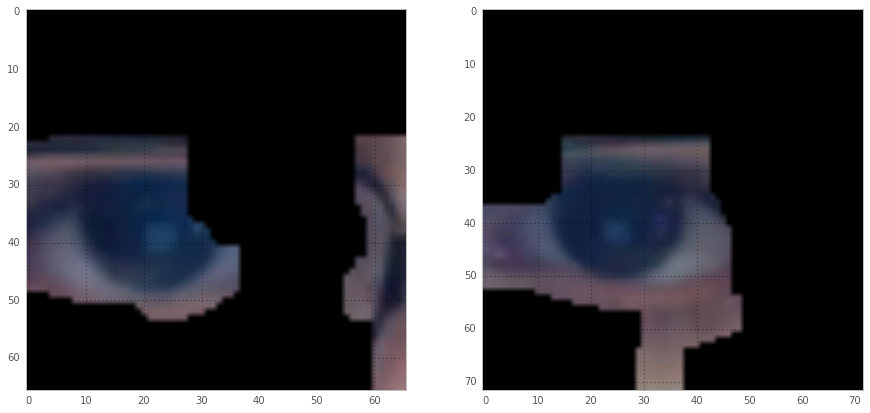

...

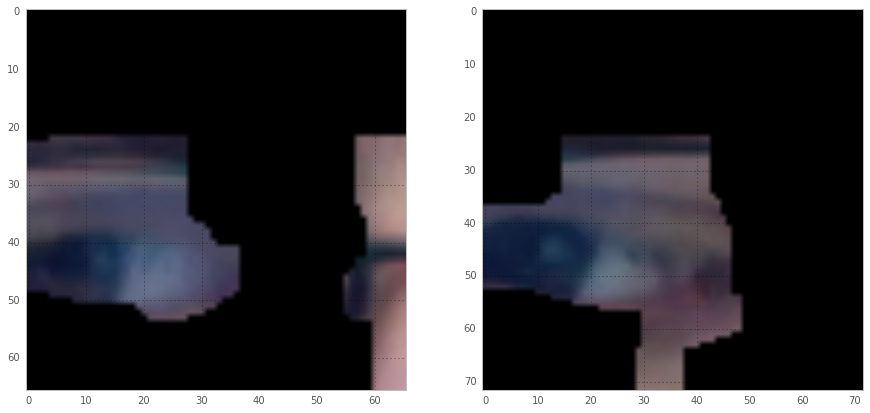

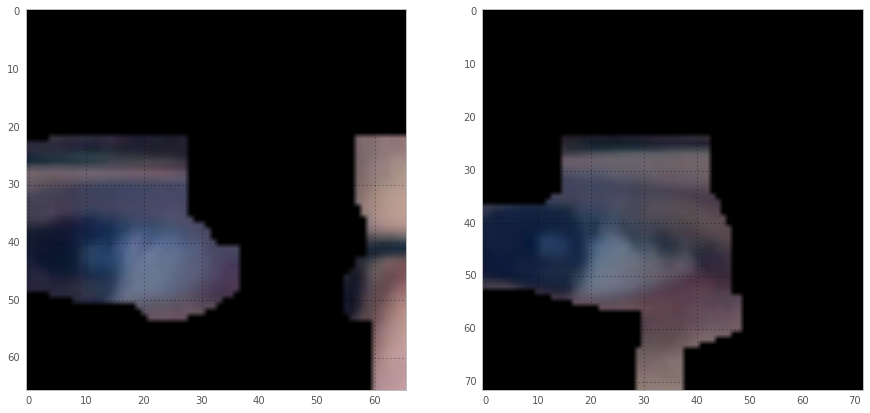

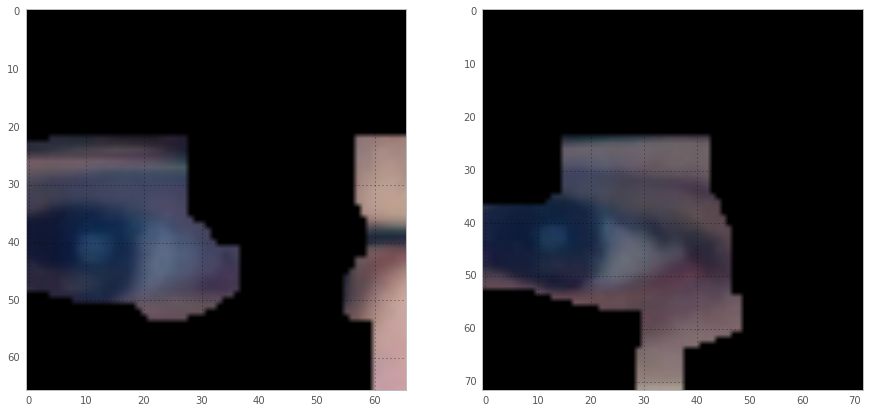

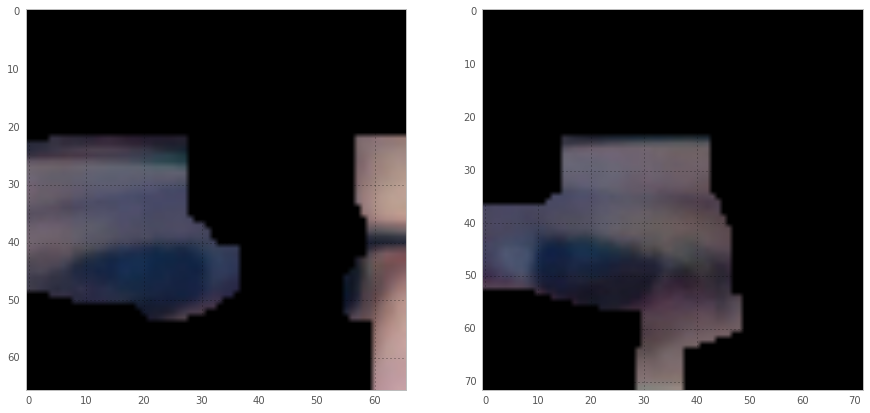

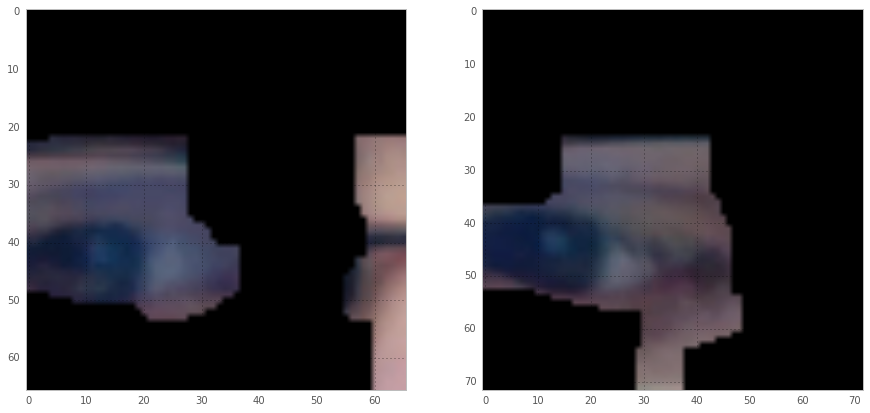

In [8]:
for i_t in range(N_frame):
    if i_t % 4 ==0: fig, axs = plt.subplots(1, 2, figsize=(15, 7.5))
    for i, (eye_movie, skin_mask) in enumerate(zip(movies, masks)):
        eye = cv2.bitwise_and(eye_movie[:, :, :, i_t].astype(np.uint8), skin_mask)
        if i_t % 4 ==0: axs[i].imshow(eye)
        axs[i].imshow(eye)

## set-up the target image

we have to bootstrap the matching alogorithms by setting up a target image

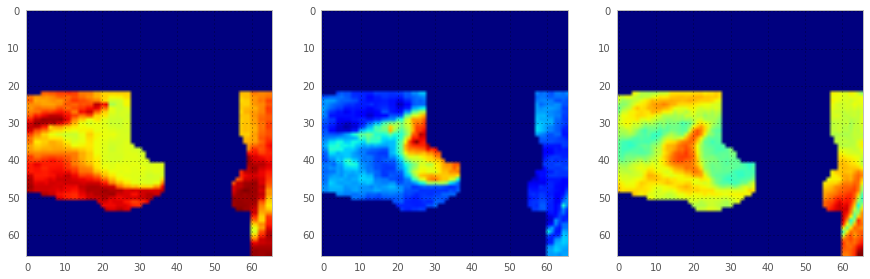

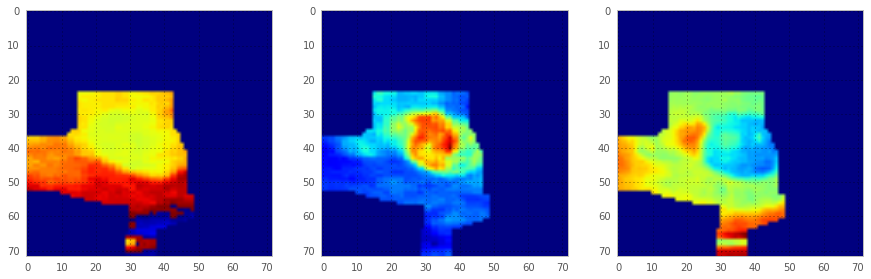

In [9]:
for i, (eye_movie, skin_mask) in enumerate(zip(movies, masks)):
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    eye = cv2.bitwise_and(eye_movie[:, :, :, 0].astype(np.uint8), skin_mask)
    hsv = cv2.cvtColor(eye, cv2.COLOR_RGB2HSV)
    for i in range (3): 
        axs[i].imshow(hsv[:, :, i])

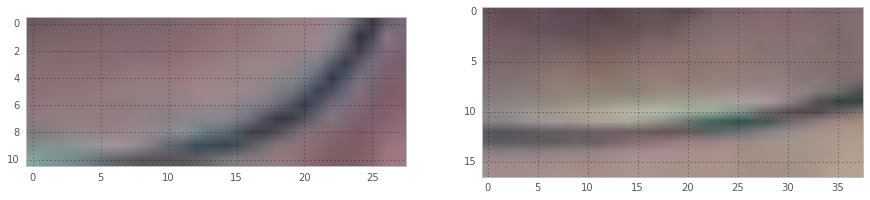

In [10]:
targets, hists = [], []
# this you have to do by hand:
track_windows = [(38, 55, 38, 38), (27, 55, 38, 38)]
fig, axs = plt.subplots(1, 2, figsize=(15, 7.5))
for i, (eye_movie, skin_mask, track_window) in enumerate(zip(movies, masks, track_windows)):
    x0, y0, x1, y1 = track_window
    x1, y1 = x1+x0, y1+y0
    #print(skin_mask.min(), skin_mask.max(), type(skin_mask[0, 0, 0]))
    target = eye_movie[:, :, :, 0].astype(np.uint8)
    #target = cv2.bitwise_and(eye_movie[:, :, :, 0].astype(np.uint8), skin_mask)
    target = target[y0:y1, x0:x1]
    #print(target.min(), target.max(), target.shape, type(target[0, 0, 0]))
    targets.append(target)
    hsv = cv2.cvtColor(target, cv2.COLOR_RGB2HSV)
    #print(hsv.min(), hsv.max(), type(hsv[0, 0, 0]))
    roihist = cv2.calcHist([hsv], [0], skin_mask[y0:y1, x0:x1, 0], [16], [0, 180])
    #print(roihist.min(), roihist.max(), type(roihist))
    # normalize histogram and apply backprojection
    cv2.normalize(roihist, roihist, 0, 255, cv2.NORM_MINMAX)
    #print(roihist.min(), roihist.max(), type(roihist))
    #skin_mask = cv2.calcBackProject([std_eye], [0,1], roihist, [0, 256], 1)
    hists.append(roihist)
    axs[i].imshow(target)

## tracking this target image

Let's use camshift to track the first image we grabed:

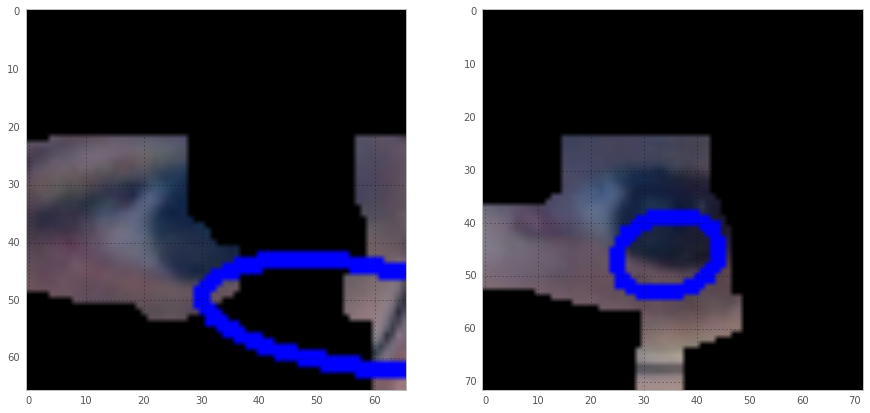

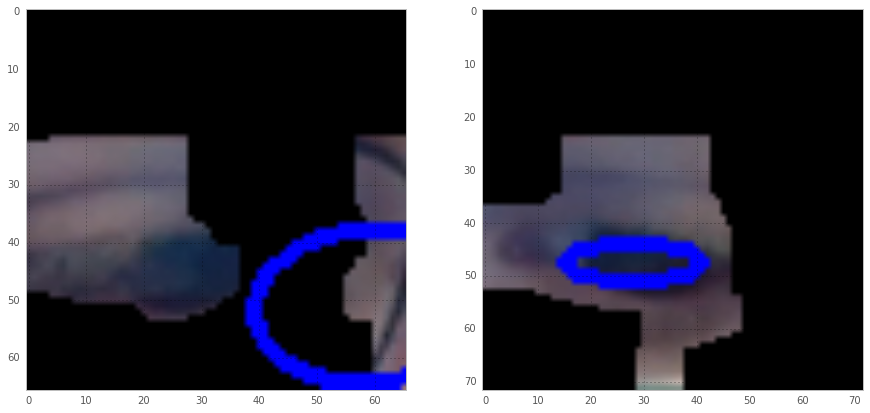

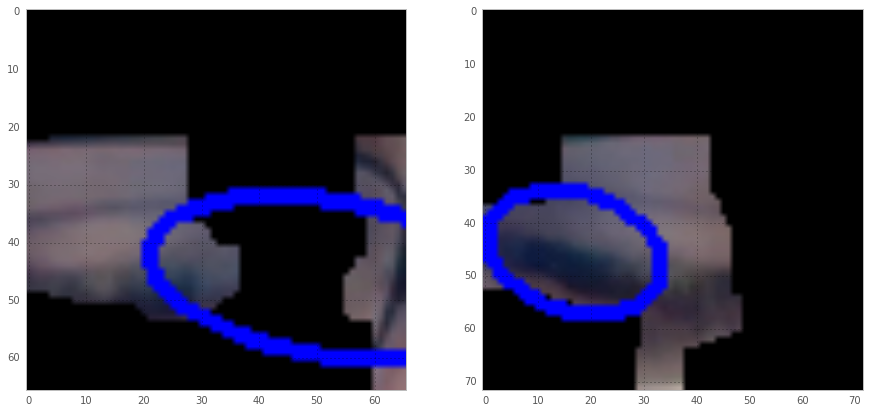

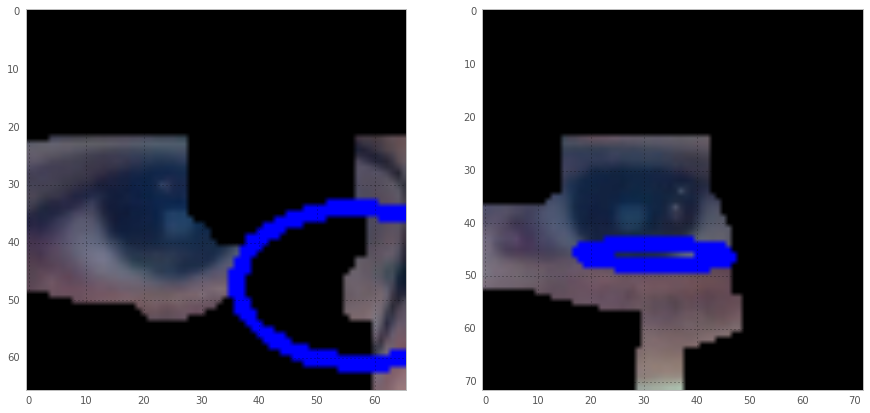

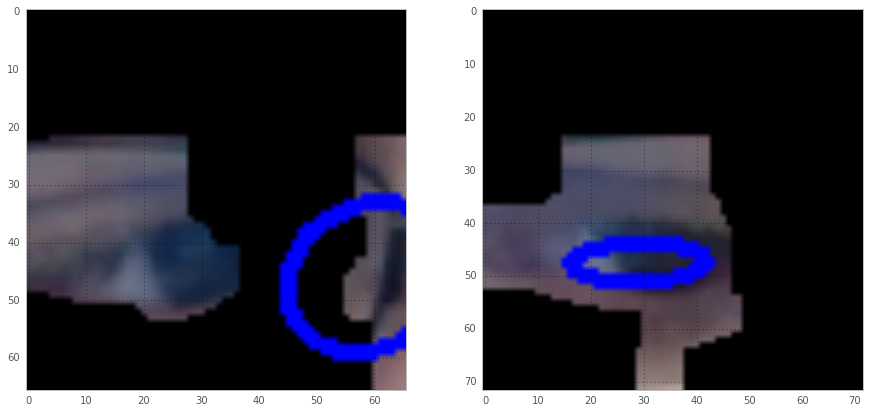

...

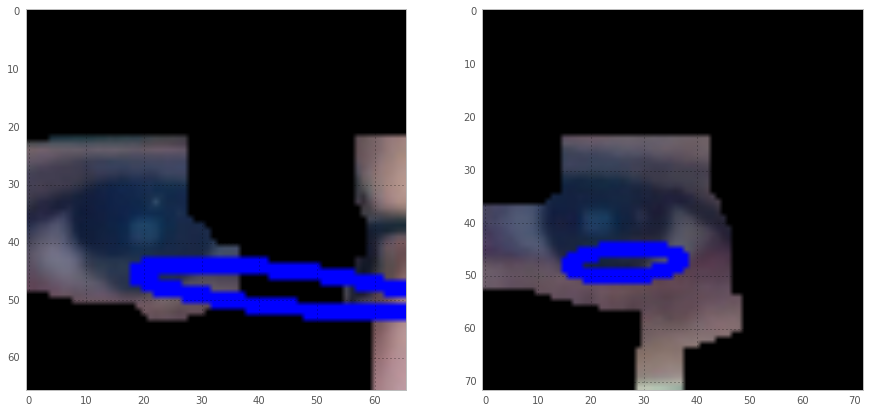

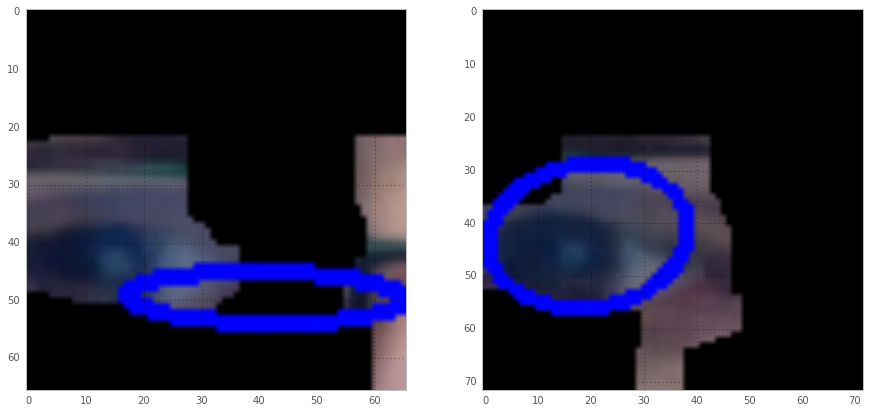

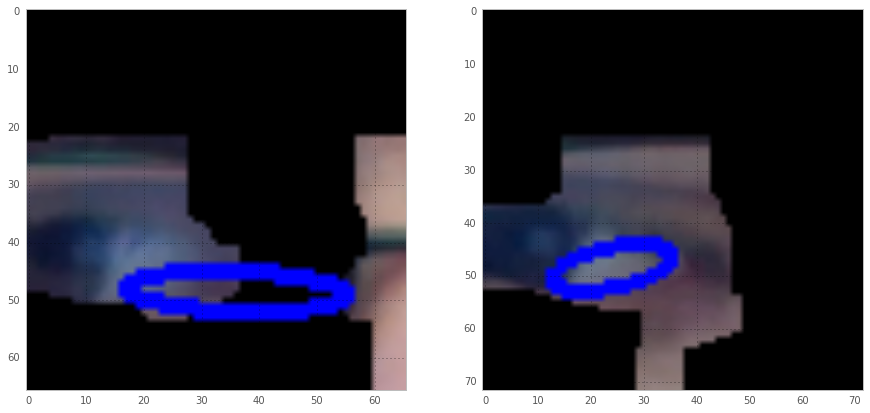

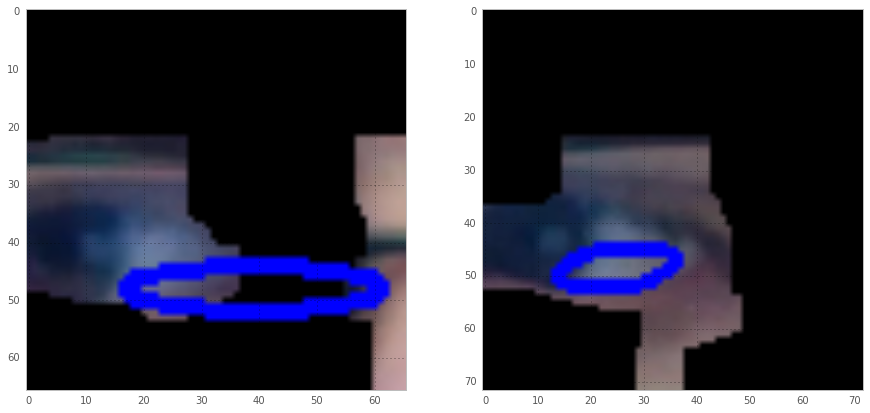

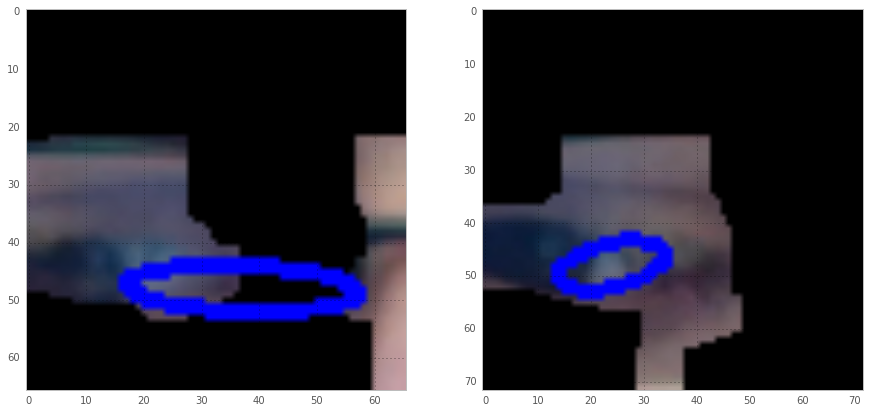

In [11]:
# initialize the termination criteria for cam shift, indicating
# a maximum of ten iterations or movement by a least one pixel
# along with the bounding box of the ROI
term_crit = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 1)

for i_t in range(N_frame):
    if i_t % 4 ==0: fig, axs = plt.subplots(1, 2, figsize=(15, 7.5))
    for i, (eye_movie, skin_mask, target, hist, track_window) in enumerate(zip(movies, masks, targets, hists, track_windows)):
        eye = cv2.bitwise_and(eye_movie[:, :, :, i_t].astype(np.uint8), skin_mask)
        hsv = cv2.cvtColor(eye, cv2.COLOR_BGR2HSV)
        prob = cv2.calcBackProject([hsv], [0], hist, [0, 255], 1)
        prob &= skin_mask[:, :, 0]
        track_box, track_window = cv2.CamShift(prob, track_window, term_crit)
        eye = cv2.ellipse(eye, track_box, (0, 0, 255), 2)
        if i_t % 4 ==0: axs[i].imshow(eye)
        #axs[i].imshow(cv2.cvtColor(track_window, cv2.COLOR_BGR2RGB))

Nice goggles, but very accurate... Something seems wrong with my implementation...

## matching the target image

Let's use the code available @ http://docs.opencv.org/3.0-last-rst/doc/py_tutorials/py_imgproc/py_template_matching/py_template_matching.html


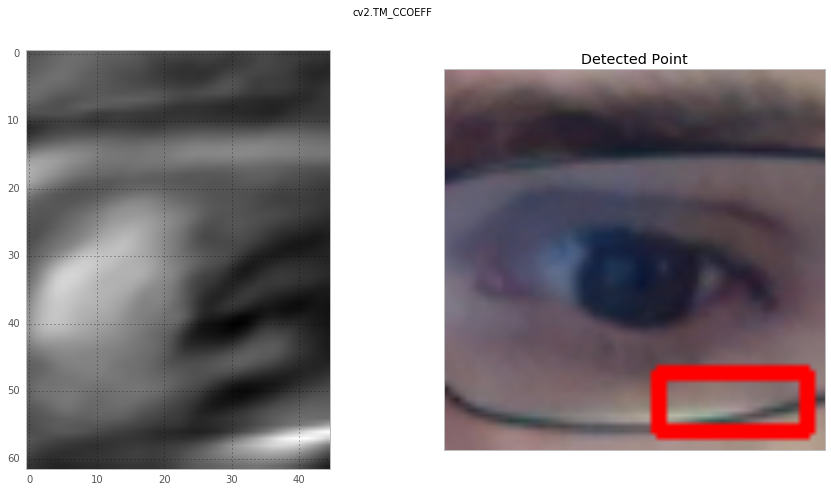

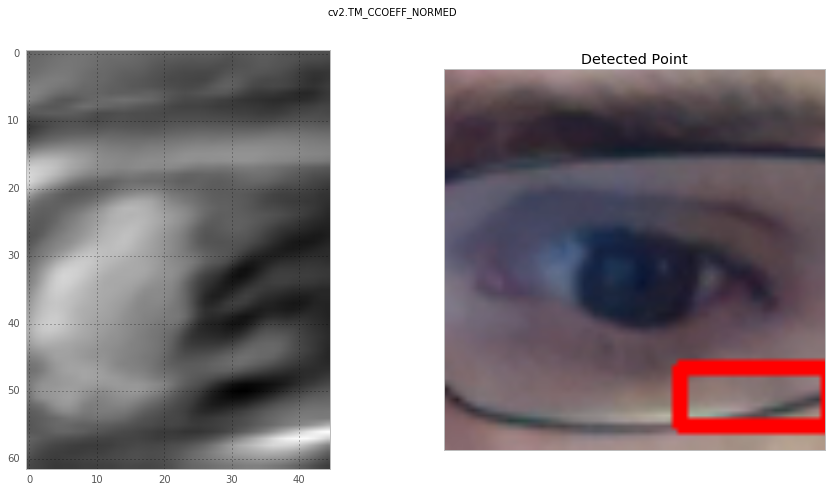

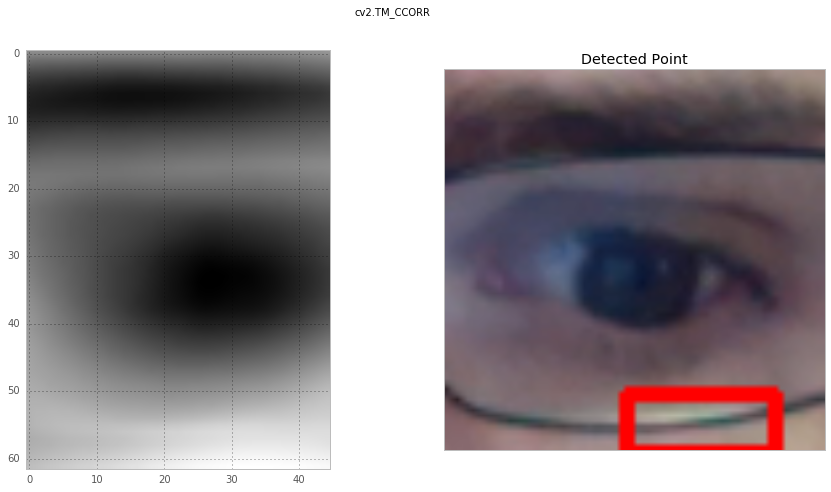

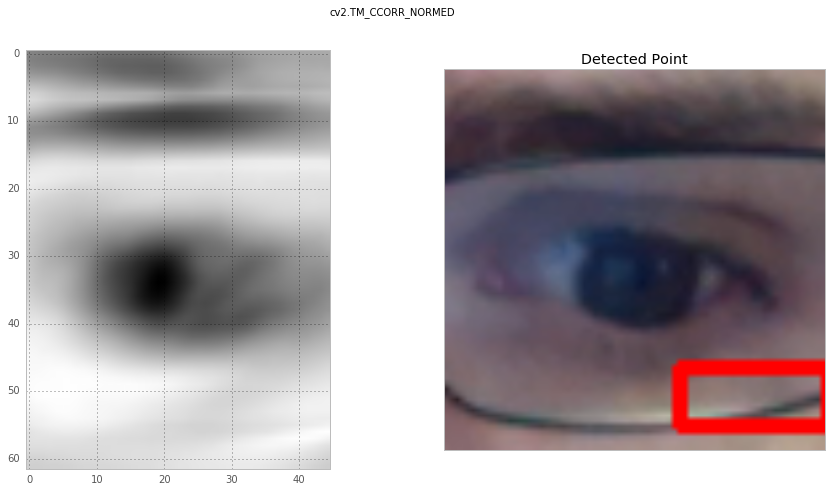

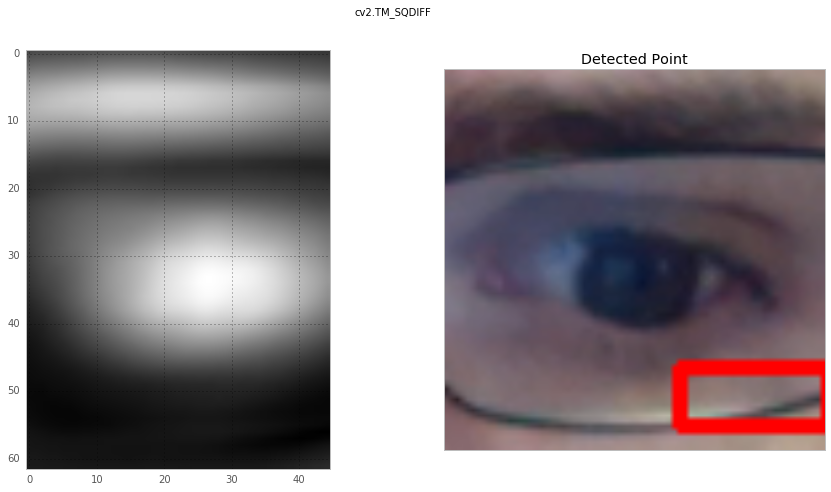

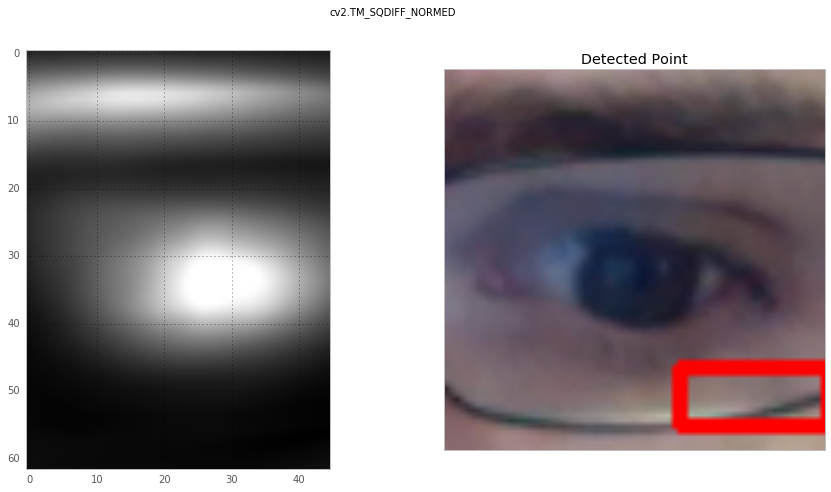

In [12]:
img2 = left_eye_movie[:, :, :, 0].copy()
#img2 = cv2.bitwise_and(img2, masks[0][:, :, 0])

template = targets[0].copy()

w, h = template.shape[1], template.shape[0]

# All the 6 methods for comparison in a list
methods = ['cv2.TM_CCOEFF', 'cv2.TM_CCOEFF_NORMED', 'cv2.TM_CCORR',
            'cv2.TM_CCORR_NORMED', 'cv2.TM_SQDIFF', 'cv2.TM_SQDIFF_NORMED']

for meth in methods:
    fig, axs = plt.subplots(1, 2, figsize=(15, 7.5))

    img = img2.copy()
    method = eval(meth)

    # Apply template Matching
    res = cv2.matchTemplate(img,template,method)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)

    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)

    cv2.rectangle(img,top_left, bottom_right, 255, 2)

    axs[0].imshow(res,cmap = 'gray')
    plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
    axs[1].imshow(img)
    plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
    plt.suptitle(meth)


Using the target image is better than with a model of it:

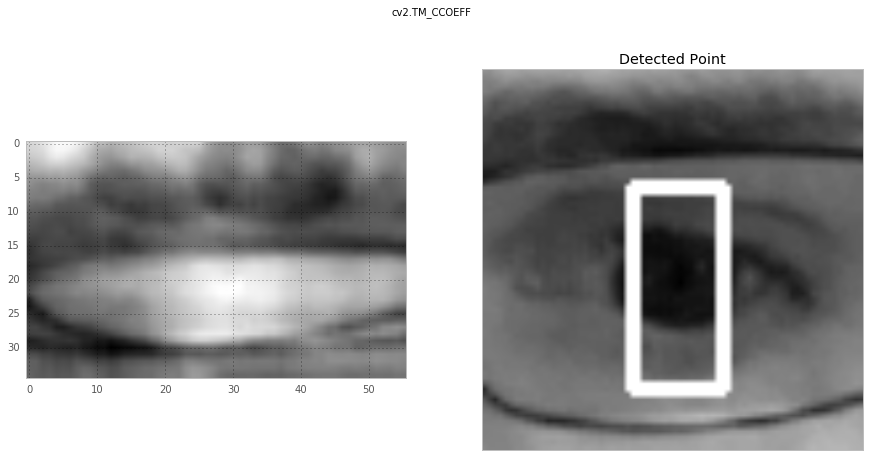

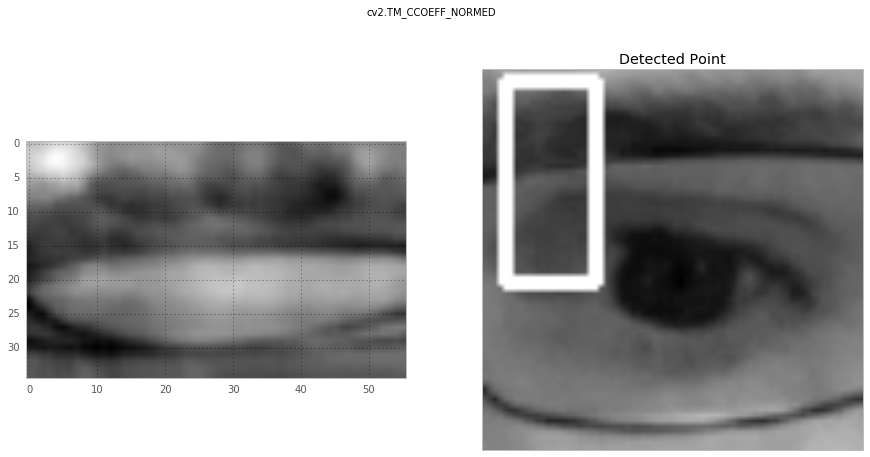

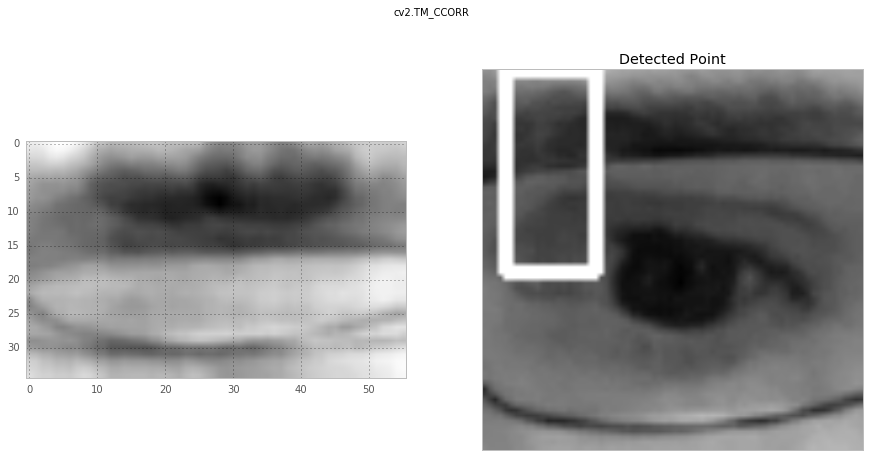

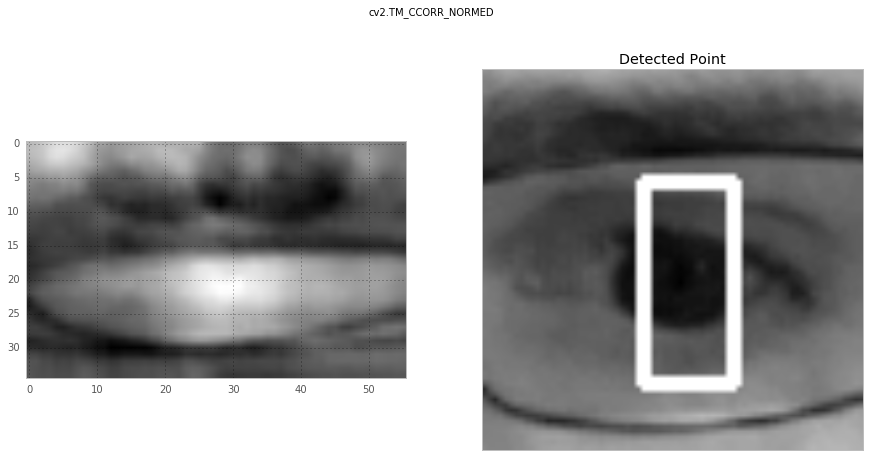

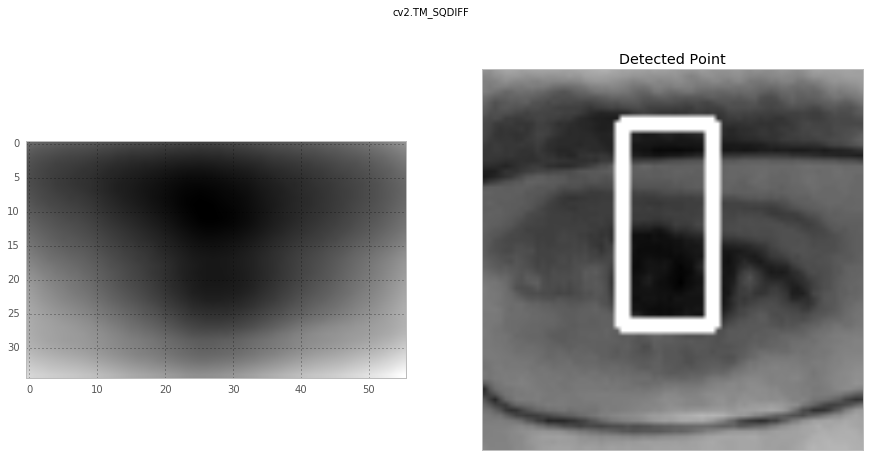

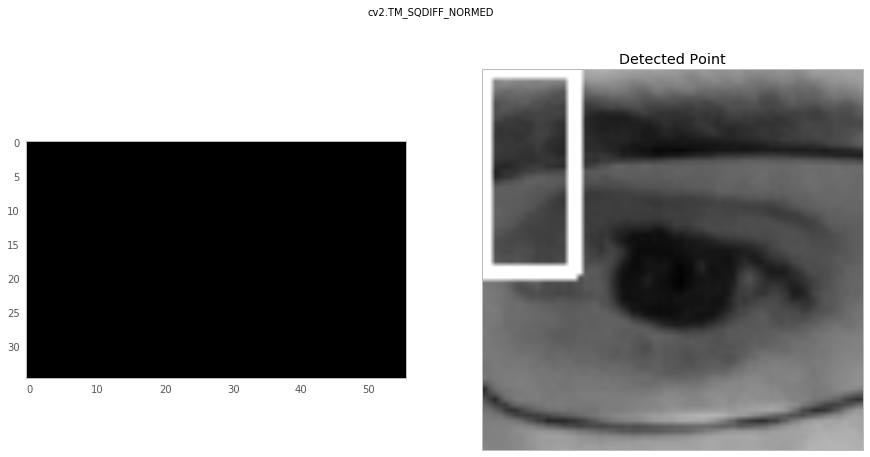

In [13]:
img2 = left_eye_movie[:, :, 0, 0].copy()

def model_eye(image, track_window):
    eye = np.zeros_like(image)
    xv, yv = np.meshgrid(np.linspace(-1, 1, eye.shape[0]), np.linspace(-1, 1, eye.shape[1]), sparse=True)  
    R2 = xv**2 + yv**2
    width = track_window[2] / eye.shape[0]
    cut_off = .05
    return np.tanh((np.sqrt(R2)-width)/cut_off)

template = model_eye(target, track_windows[0])
template = (template-template.min())/(template.max()-template.min())* 255
template = template.astype(np.uint8)

w, h = template.shape[1], template.shape[0]

# All the 6 methods for comparison in a list
methods = ['cv2.TM_CCOEFF', 'cv2.TM_CCOEFF_NORMED', 'cv2.TM_CCORR',
            'cv2.TM_CCORR_NORMED', 'cv2.TM_SQDIFF', 'cv2.TM_SQDIFF_NORMED']

for meth in methods:
    fig, axs = plt.subplots(1, 2, figsize=(15, 7.5))

    img = img2.copy()
    method = eval(meth)

    # Apply template Matching
    res = cv2.matchTemplate(img,template,method)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)

    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)

    cv2.rectangle(img, top_left, bottom_right, 255, 2)

    axs[0].imshow(res, cmap = 'gray')
    plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
    axs[1].imshow(img, cmap = 'gray')
    plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
    plt.suptitle(meth)


Let's try for different frames:

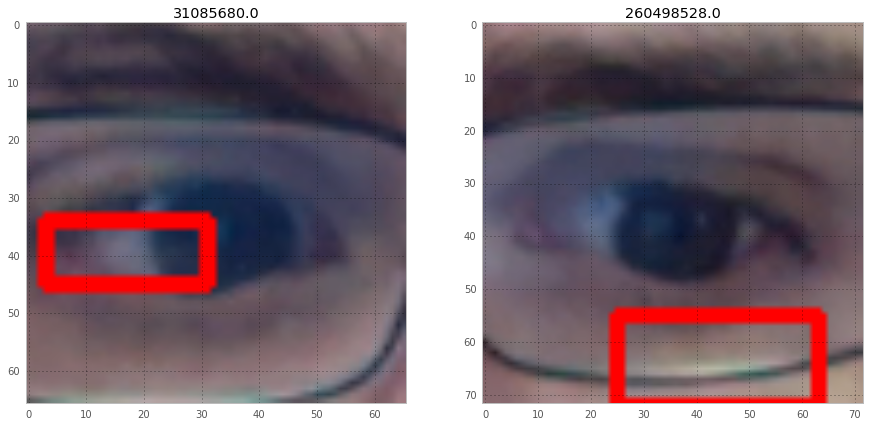

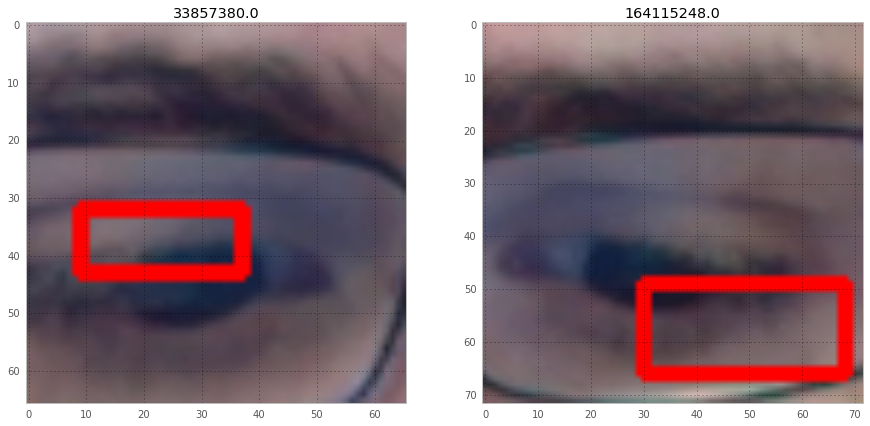

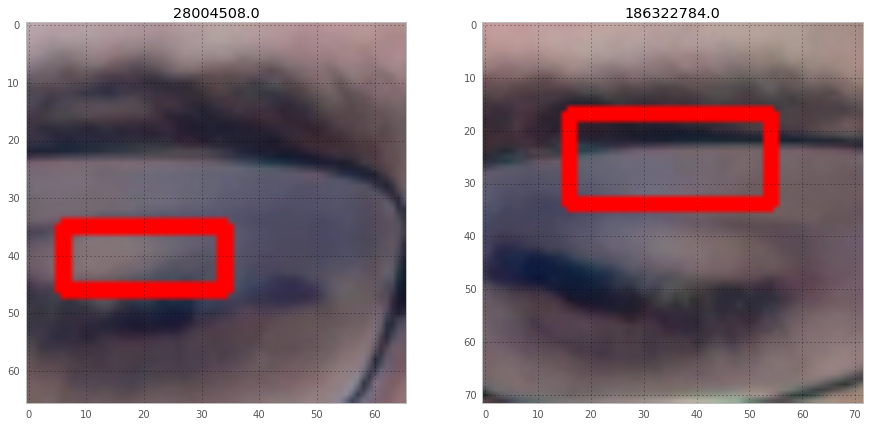

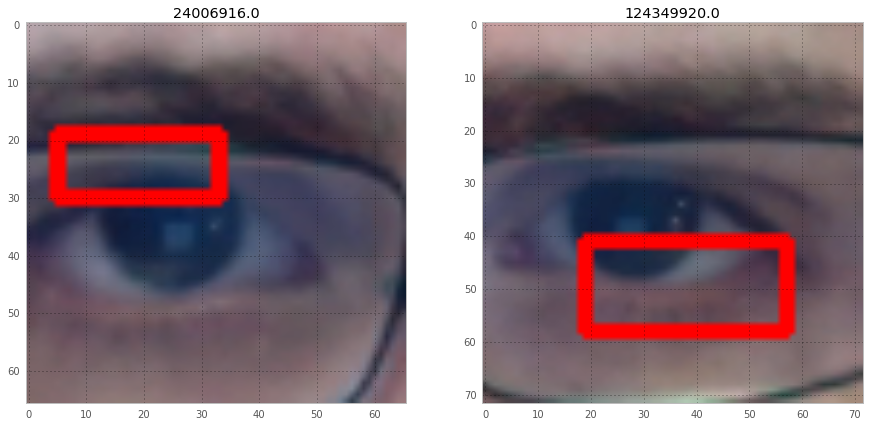

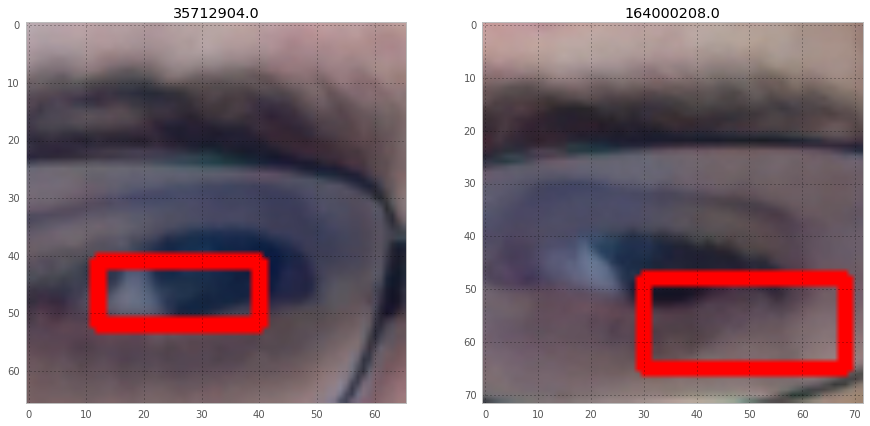

...

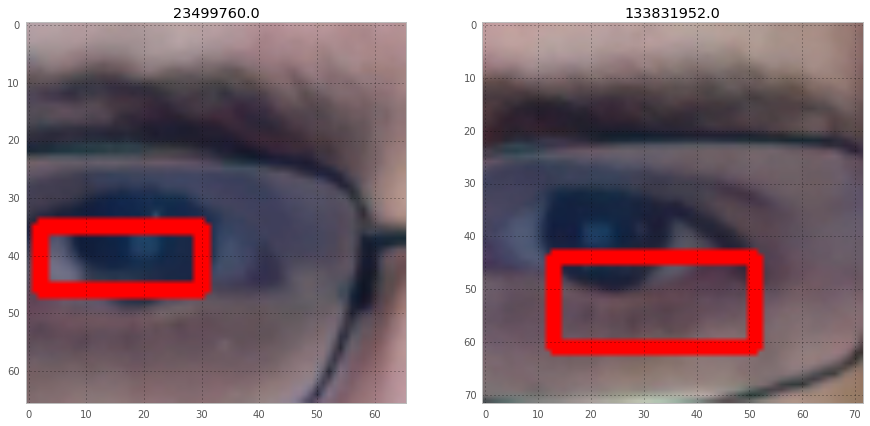

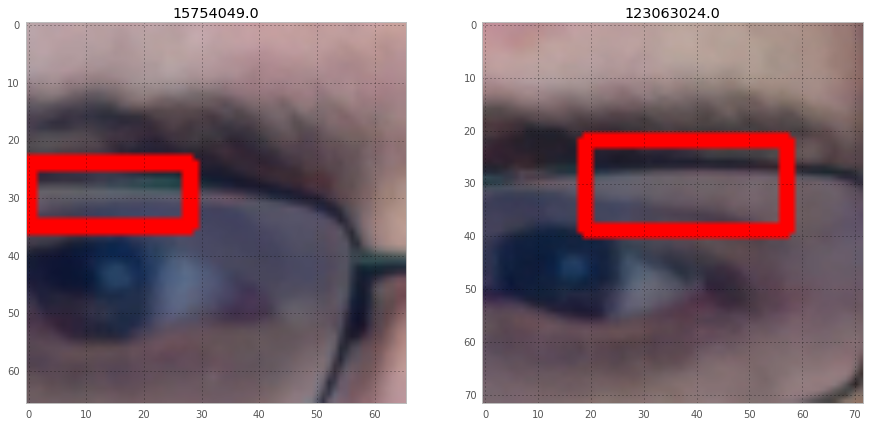

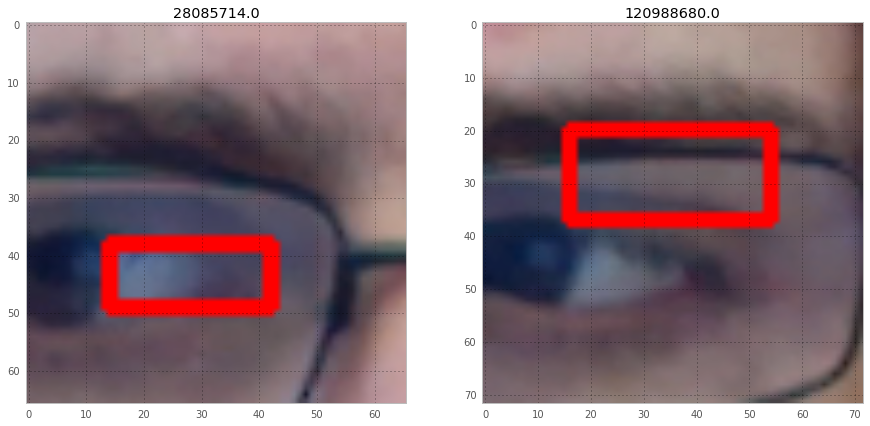

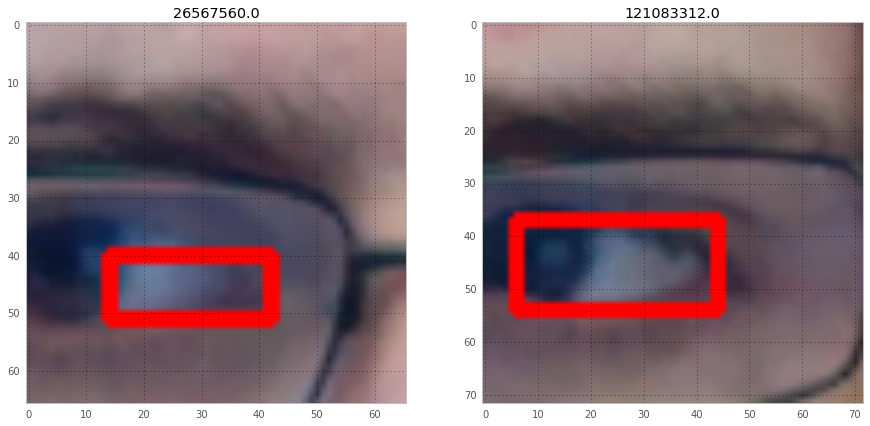

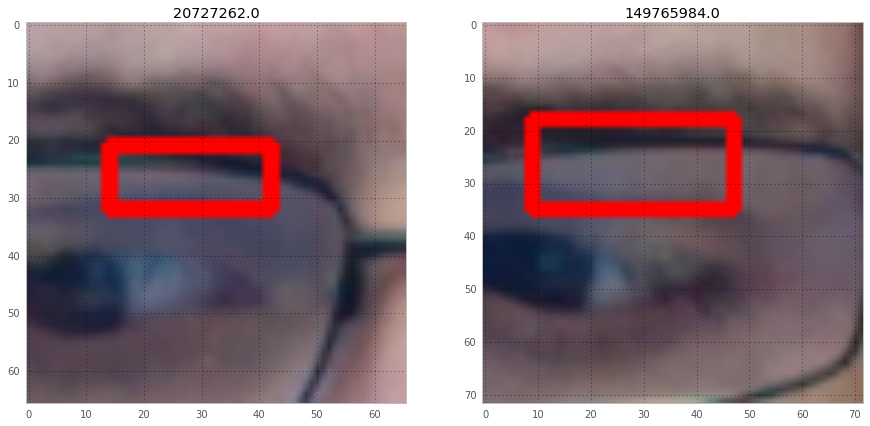

In [14]:
for i_t in range(N_frame):
    if i_t % 4 ==0: fig, axs = plt.subplots(1, 2, figsize=(15, 7.5))
    for i, (eye_movie, skin_mask, target) in enumerate(zip(movies, masks, targets)):
        #eye = cv2.bitwise_and(eye_movie[:, :, :, i_t].astype(np.uint8), skin_mask)
        eye = eye_movie[:, :, :, i_t].astype(np.uint8)
        template = target.copy()
        w, h = template.shape[1], template.shape[0]
        # print(template.shape)
        res = cv2.matchTemplate(eye, template, cv2.TM_CCOEFF)
        res *= skin_mask[h//2-1:-h//2, w//2-1:-w//2, 0]

        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
        #print(min_val, max_val, min_loc, max_loc)
        bottom_right = (max_loc[0] + w, max_loc[1] + h)

        cv2.rectangle(eye, max_loc, bottom_right, 255, 2)
        if i_t % 4 ==0: axs[i].imshow(eye), axs[i].set_title(max_val)
        #axs[i].imshow(cv2.cvtColor(track_window, cv2.COLOR_BGR2RGB))

Do other methods perform better? using edges is finer but perhaps less robust...

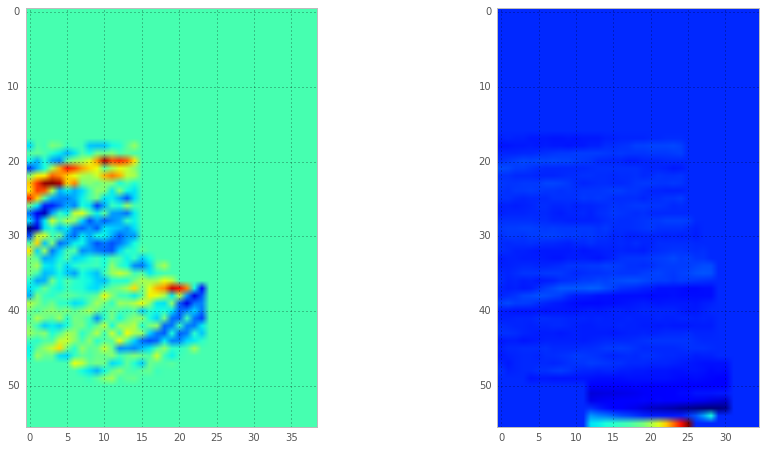

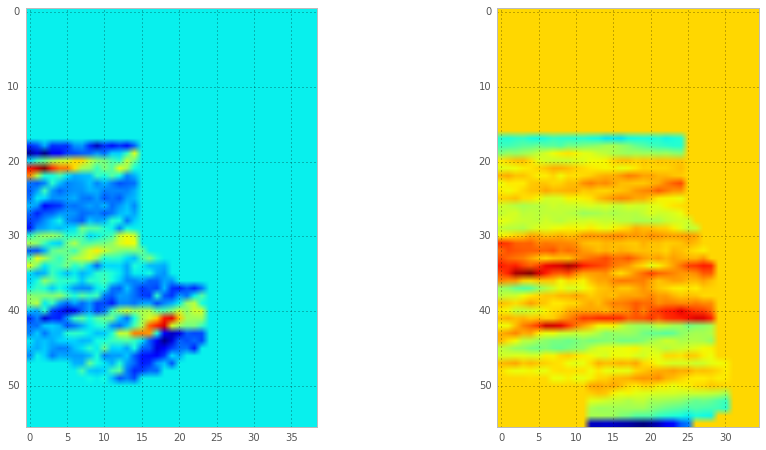

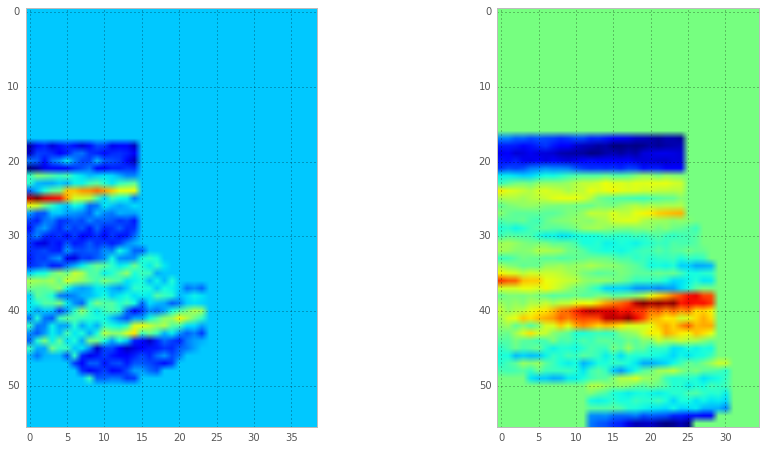

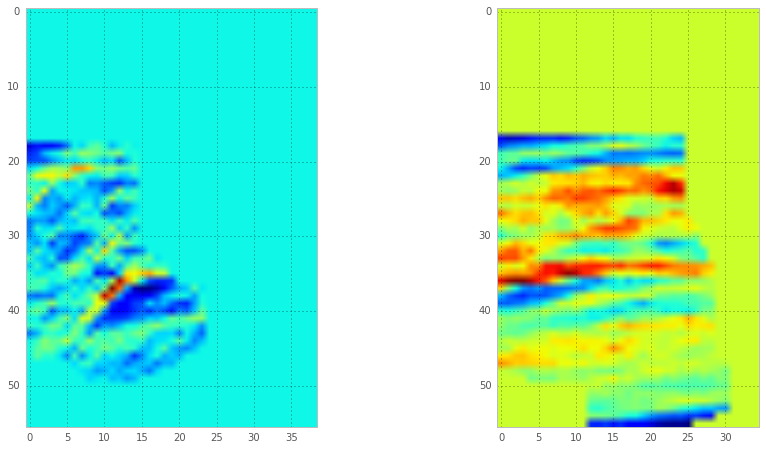

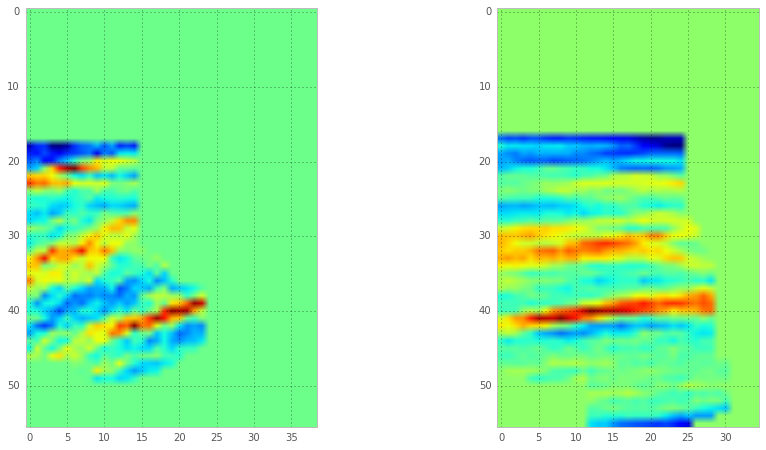

...

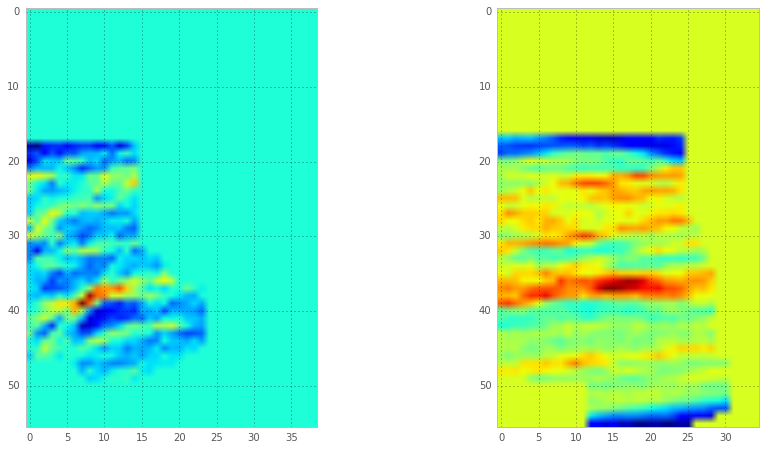

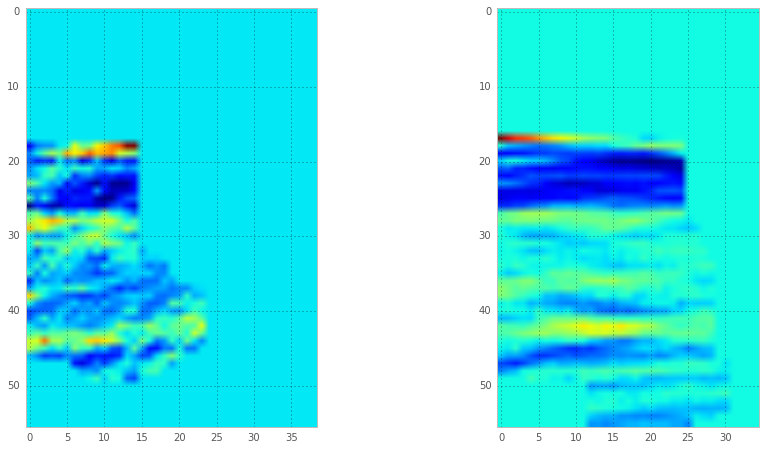

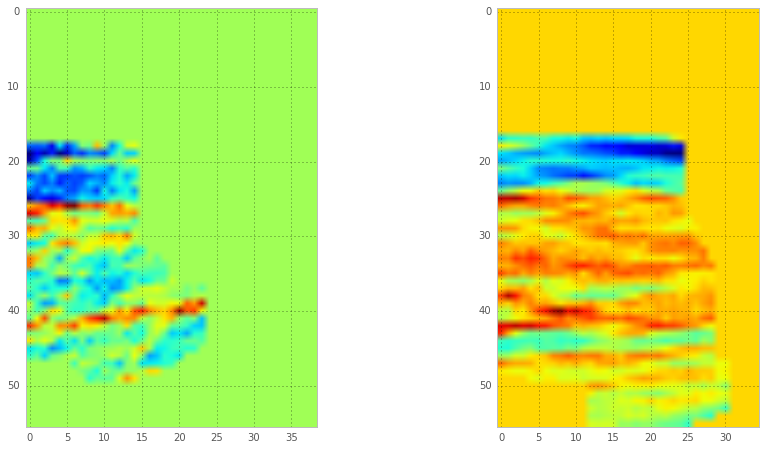

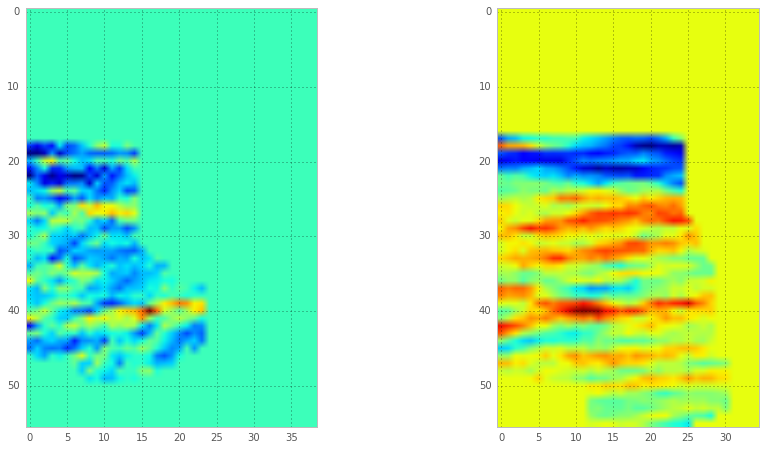

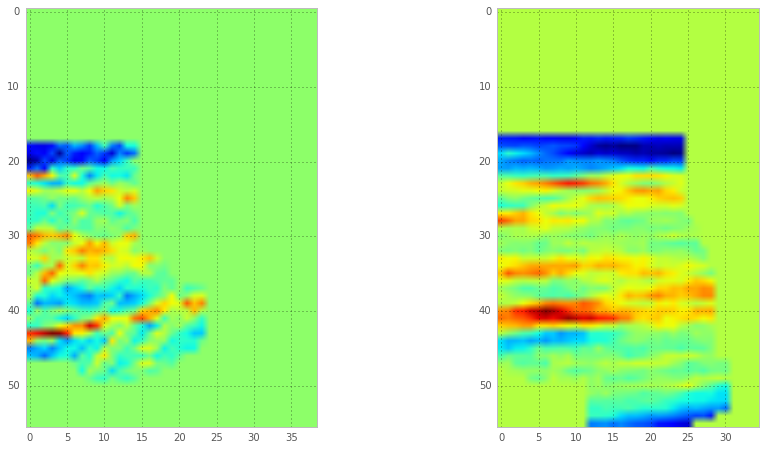

In [15]:
for i_t in range(N_frame):
    if i_t % 4 ==0: fig, axs = plt.subplots(1, 2, figsize=(15, 7.5))
    for i, (eye_movie, skin_mask, target) in enumerate(zip(movies, masks, targets)):
        #eye = cv2.bitwise_and(eye_movie[:, :, :, i_t].astype(np.uint8), skin_mask)
        eye = eye_movie[:, :, :, i_t].astype(np.uint8)
        #eye = cv2.cvtColor(eye, cv2.COLOR_BGR2HSV)
        eye = cv2.Laplacian(eye, cv2.CV_8U)
        template = target.copy()
        template = cv2.Laplacian(template, cv2.CV_8U)
        #template = cv2.cvtColor(template, cv2.COLOR_BGR2HSV)
        w, h = template.shape[1], template.shape[0]
        #print(w, h)
        res = cv2.matchTemplate(eye, template, cv2.TM_CCOEFF)
        #print(res.min(), res.max(), res.shape, type(res[0, 0]))

        res *= skin_mask[h//2-1:-h//2, w//2-1:-w//2, 0]
        #print(res.min(), res.max(), res.shape, type(res[0, 0]))

        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
        bottom_right = (max_loc[0] + w, max_loc[1] + h)

        cv2.rectangle(eye, max_loc, bottom_right, 255, 2)

        if i_t % 4 ==0: axs[i].imshow(res)
        #if i_t % 4 ==0: axs[i].imshow(eye)


Using whitening should be enough and robust:


In [16]:
import SLIP
for i_t in range(N_frame):
    if i_t % 4 ==0: fig, axs = plt.subplots(1, 2, figsize=(15, 7.5))
    for i, (eye_movie, skin_mask, target) in enumerate(zip(movies, masks, targets)):
        from SLIP import Image
        im = Image(eye_movie[:(2*(eye_movie.shape[0]//2)), :(2*(eye_movie.shape[1]//2)), 0, 0])
        im.pe.white_n_learning = 0
        im.pe.white_N= .07,
        im.pe.white_f_0= .38, 
        im.pe.white_alpha= 1.4
        im.pe.white_steepness= 4.
        #print(im.pe.N_X)
        eye_template = cv2.imread('../src/my_eye.png')
        im2 = Image(eye_template[:(2*(eye_template.shape[0]//2)), :(2*(eye_template.shape[1]//2)), 0])
        im2.pe.white_n_learning = 0
        im2.pe.white_N= .07,
        im2.pe.white_f_0= .38, 
        im2.pe.white_alpha= 1.4
        im2.pe.white_steepness= 4.
        #eye = cv2.bitwise_and(eye_movie[:, :, :, i_t].astype(np.uint8), skin_mask)
        eye = eye_movie[:, :, :, i_t].astype(np.uint8)
        #eye = cv2.cvtColor(eye, cv2.COLOR_BGR2HSV)
        eye = eye.sum(axis=-1)[:(2*(eye.shape[0]//2)), :(2*(eye.shape[1]//2))]
        #print(eye.shape)
        eye = im.whitening(eye)
        template = eye_template.copy()
        template = template.sum(axis=-1)[:(2*(eye.shape[0]//2)), :(2*(eye.shape[1]//2))]
        template = im2.whitening(template)
        #template = cv2.cvtColor(template, cv2.COLOR_BGR2HSV)
        w, h = template.shape[1], template.shape[0]
        #print(w, h)
        eye = (eye-eye.min())/(eye.max()-eye.min())* 255
        eye = eye.astype(np.uint8)
        template = (template-template.min())/(template.max()-template.min())* 255
        template = template.astype(np.uint8)

        res = cv2.matchTemplate(eye, template, cv2.TM_CCOEFF)
        #print(res.min(), res.max(), res.shape, type(res[0, 0]))

        #res *= skin_mask[h//2-1:-h//2, w//2-1:-w//2, 0]
        #print(res.min(), res.max(), res.shape, type(res[0, 0]))

        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
        bottom_right = (max_loc[0] + w, max_loc[1] + h)

        #cv2.rectangle(eye, max_loc, bottom_right, 255, 2)

        if i_t % 4 ==0: axs[i].imshow(res)
        #if i_t % 4 ==0: axs[i].imshow(eye)


ImportError: No module named 'SLIP'

And matching in HSV space?

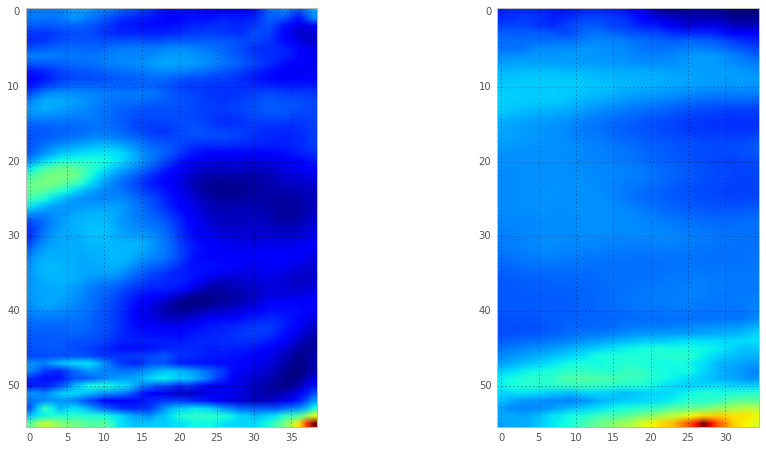

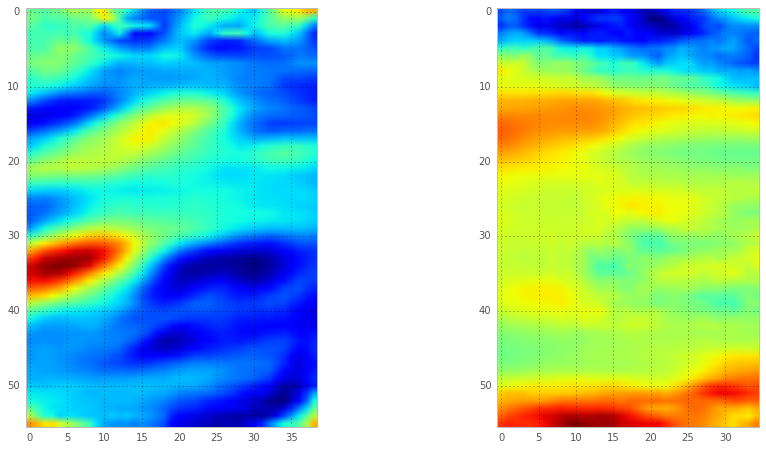

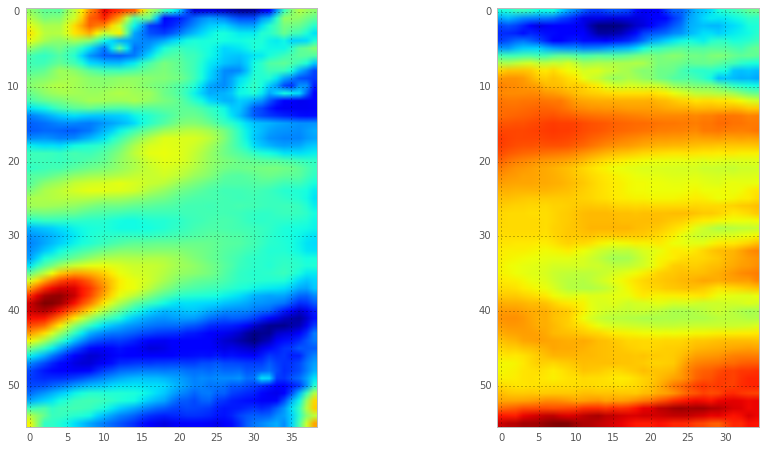

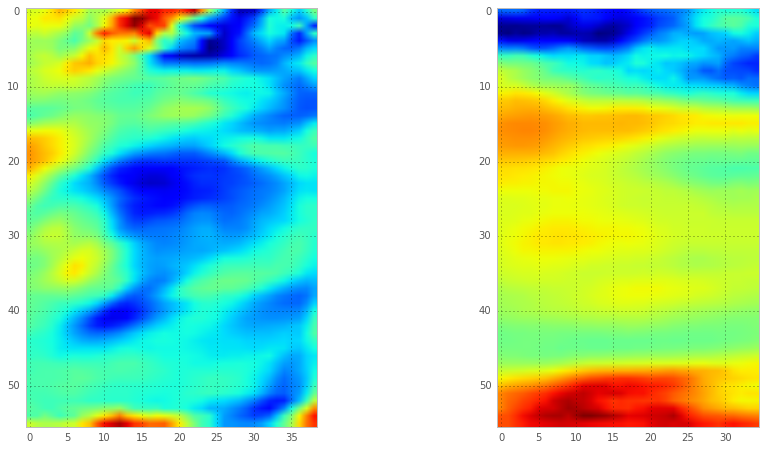

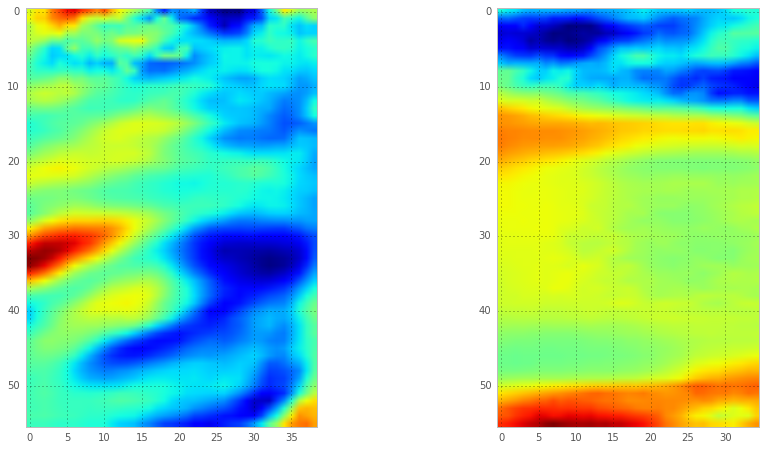

...

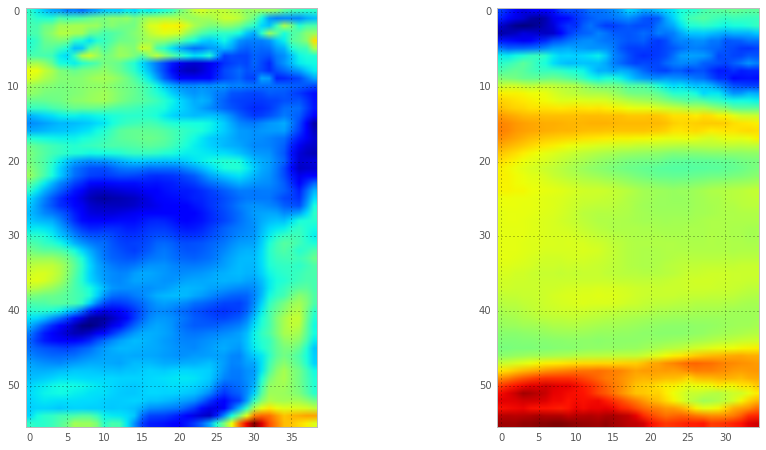

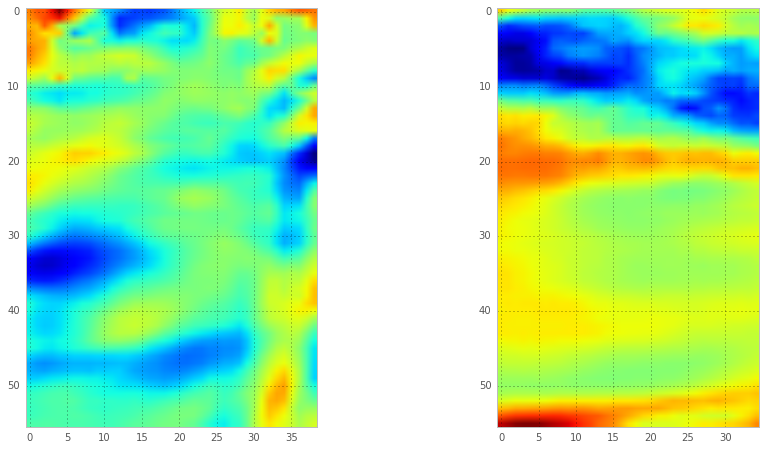

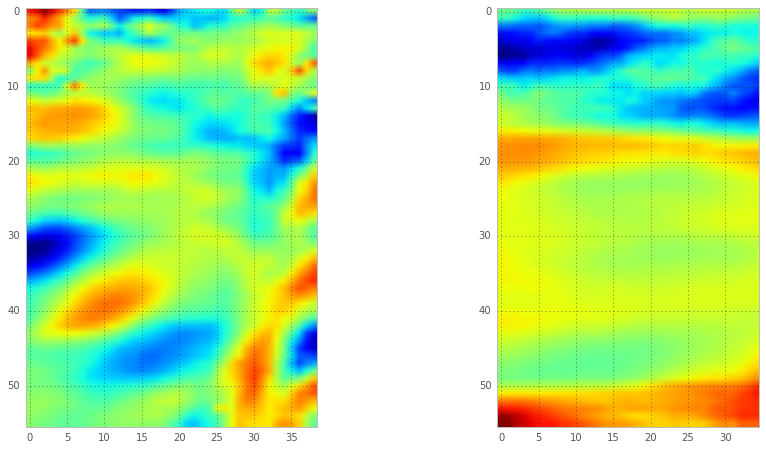

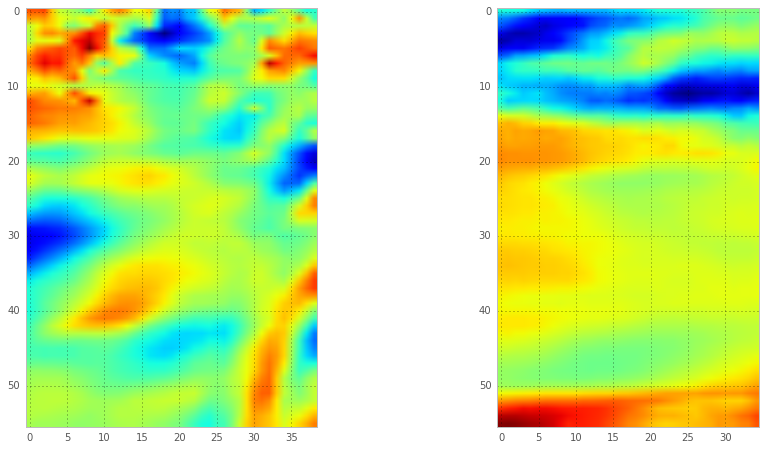

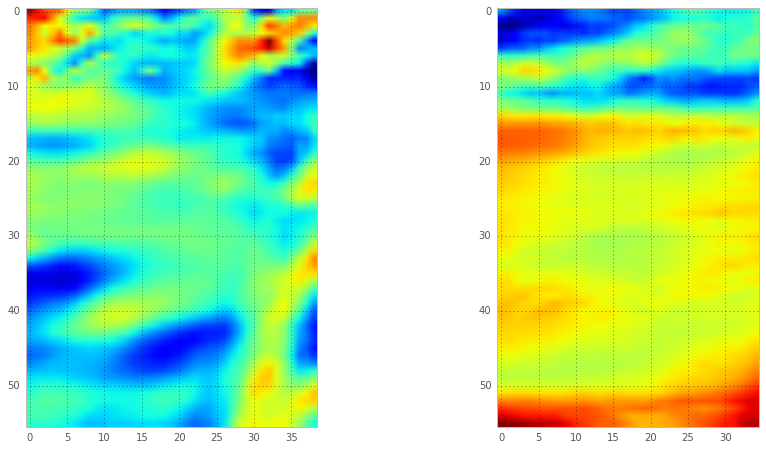

In [17]:

for i_t in range(N_frame):
    if i_t % 4 ==0: fig, axs = plt.subplots(1, 2, figsize=(15, 7.5))
    for i, (eye_movie, skin_mask, target) in enumerate(zip(movies, masks, targets)):
        eye = eye_movie[:, :, :, i_t].astype(np.uint8)
        eye = cv2.cvtColor(eye, cv2.COLOR_RGB2HSV)
        template = target.copy()
        template = cv2.cvtColor(template, cv2.COLOR_RGB2HSV)
        w, h = template.shape[1], template.shape[0]
        
        res = cv2.matchTemplate(eye, template, cv2.TM_CCOEFF)
        
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
        bottom_right = (max_loc[0] + w, max_loc[1] + h)

        #cv2.rectangle(eye, max_loc, bottom_right, 255, 2)

        if i_t % 4 ==0: axs[i].imshow(res)
        #if i_t % 4 ==0: axs[i].imshow(eye)


the first option was the most robust.

## let's use the prototypical eye...

Let's keep the best results and then do the detection again

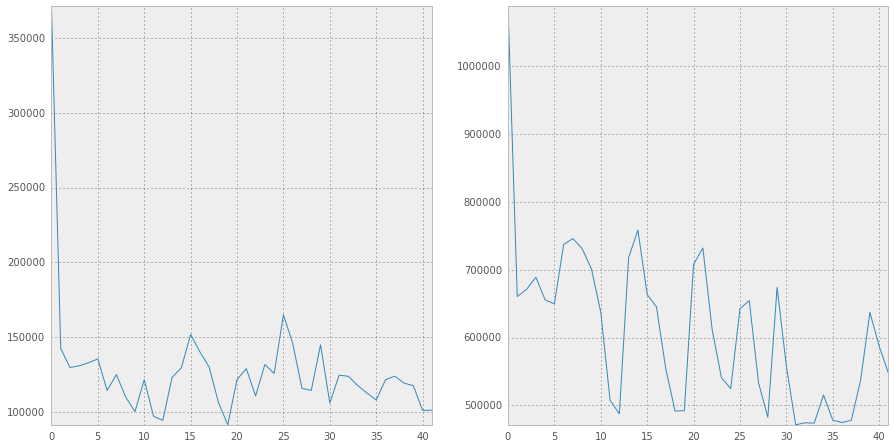

In [18]:
eye_templates = []
fig, axs = plt.subplots(1, 2, figsize=(15, 7.5))
for i, (eye_movie, skin_mask, target) in enumerate(zip(movies, masks, targets)):
    max_val = np.zeros(N_frame)
    for i_t in range(N_frame):
        eye = eye_movie[:, :, :, i_t].copy()
        template = target.copy()
        w, h = template.shape[1], template.shape[0]
        # print(template.shape)
        res = cv2.matchTemplate(eye, template, cv2.TM_CCOEFF)
        min_val, max_val[i_t], min_loc, max_loc = cv2.minMaxLoc(res)
    axs[i].plot(max_val)
    axs[i].axis('tight')

This build a new "prototypical eye":

-233.872703108 140.126363384 (11, 28, 3) <class 'numpy.float64'>
0 255 <class 'numpy.uint8'>
18 122 <class 'numpy.uint8'>
-370.395434577 203.258272077 (17, 38, 3) <class 'numpy.float64'>
0 255 <class 'numpy.uint8'>
23 120 <class 'numpy.uint8'>


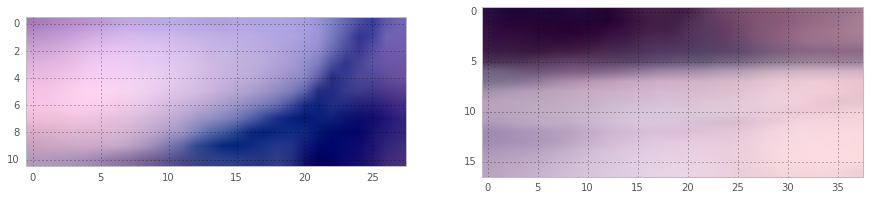

In [19]:
eye_templates = []
fig, axs = plt.subplots(1, 2, figsize=(15, 7.5))
for i, (eye_movie, skin_mask, target) in enumerate(zip(movies, masks, targets)):
    eye_template = np.zeros((target.shape[0], target.shape[1], target.shape[2], N_frame))
    for i_t in range(N_frame):
        eye = eye_movie[:, :, :, i_t].copy()
        template = target.copy()
        w, h = template.shape[1], template.shape[0]
        # print(template.shape)
        res = cv2.matchTemplate(eye, template, cv2.TM_CCOEFF)
        min_val, max_val_, min_loc, max_loc = cv2.minMaxLoc(res)
        #print(min_val, max_val, min_loc, max_loc)
        bottom_right = (max_loc[0] + w, max_loc[1] + h)
        
        weight = (max_val[i_t]-max_val.min())/(max_val.max()-max_val.min())
        #print(weight)
        eye_template[:, :, :, i_t] = weight * eye[max_loc[1]:max_loc[1] + h, max_loc[0]:max_loc[0] + w].astype(np.float64)
        #print(eye_template.min(), eye_template.max(), type(eye_template[0,0,0]))

    precision_eye_template = eye_template.std(axis=-1) # get deviation
    eye_template = eye_template.sum(axis=-1) # sum over all frames
    eye_template -= eye_template.mean()
    eye_template *= np.exp(-precision_eye_template / (precision_eye_template.mean() * 2.) )
    print(eye_template.min(), eye_template.max(), eye_template.shape, type(eye_template[0,0,0]))

    eye_template = (eye_template-eye_template.min())/(eye_template.max()-eye_template.min())*255
    eye_template = eye_template.astype(np.uint8)
    print(eye_template.min(), eye_template.max(), type(eye_template[0,0,0]))
    print(eye[max_loc[1]:max_loc[1] + h, max_loc[0]:max_loc[0] + w].min(), eye[max_loc[1]:max_loc[1] + h, max_loc[0]:max_loc[0] + w].max(), type(eye[max_loc[1]:max_loc[1] + h, max_loc[0]:max_loc[0] + w][0,0,0]))
    axs[i].imshow(eye_template)
    #axs[i].imshow(eye[max_loc[1]:max_loc[1] + h, max_loc[0]:max_loc[0] + w])
    eye_templates.append(eye_template)
    #axs[i].imshow(cv2.cvtColor(eye_template, cv2.COLOR_BGR2RGB))


/usr/local/lib/python3.5/site-packages/ipykernel/__main__.py:10: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


ValueError: operands could not be broadcast together with shapes (56,39) (39,57) (56,39) 

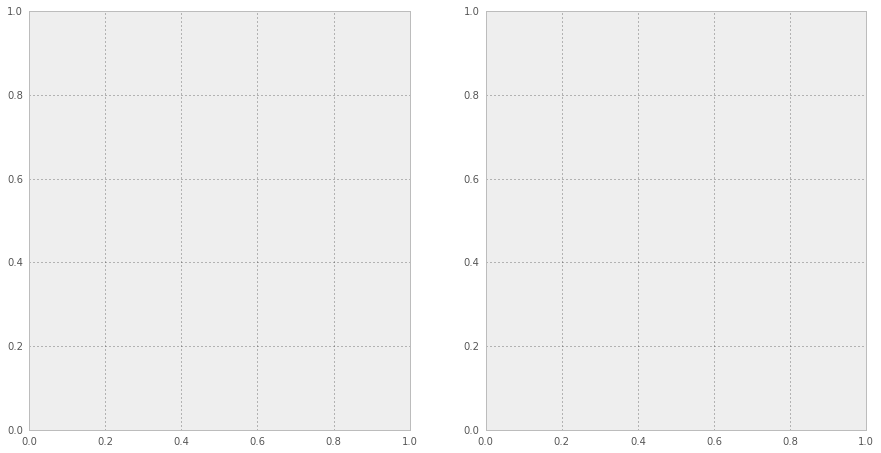

In [20]:
for i_t in range(N_frame):
    if i_t % 4 ==0: fig, axs = plt.subplots(1, 2, figsize=(15, 7.5))
    for i, (eye_movie, skin_mask, target) in enumerate(zip(movies, masks, eye_templates)):
        #eye = cv2.bitwise_and(eye_movie[:, :, :, i_t].astype(np.uint8), skin_mask)
        eye = eye_movie[:, :, :, i_t].astype(np.uint8)
        template = target.copy()
        w, h = template.shape[1], template.shape[0]
        # print(template.shape)
        res = cv2.matchTemplate(eye, template, cv2.TM_CCOEFF)
        res *= skin_mask[w/2-1:-w/2, h/2-1:-h/2, 0]

        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
        #print(min_val, max_val, min_loc, max_loc)
        bottom_right = (max_loc[0] + w, max_loc[1] + h)

        cv2.rectangle(eye, max_loc, bottom_right, 255, 2)
        if i_t % 4 ==0: axs[i].imshow(eye), axs[i].set_title(max_val)
        #axs[i].imshow(cv2.cvtColor(track_window, cv2.COLOR_BGR2RGB))

We can now save it to use again in future detections.

In [21]:
cv2.imwrite('../src/my_eye.png', eye_templates[0])

True

## Simplifying the whole process

In [22]:
import time
start = time.time()
import cv2

face_cascade = cv2.CascadeClassifier('/usr/local/Cellar/opencv3/3.1.0_1/share/OpenCV/haarcascades/haarcascade_frontalface_default.xml')
eye_cascade = cv2.CascadeClassifier('/usr/local/Cellar/opencv3/3.1.0_1/share/OpenCV/haarcascades/haarcascade_eye.xml')
lefteye_cascade = cv2.CascadeClassifier('/usr/local/Cellar/opencv3/3.1.0_1/share/OpenCV/haarcascades/haarcascade_lefteye_2splits.xml')
righteye_cascade = cv2.CascadeClassifier('/usr/local/Cellar/opencv3/3.1.0_1/share/OpenCV/haarcascades/haarcascade_righteye_2splits.xml')

def get_just_one(image, cascade):
    # We set set minNeighbors=1 then increase it until we have one face only - same for eyes see http://stackoverflow.com/questions/22249579/opencv-detectmultiscale-minneighbors-parameter
    features, minNeighbors = [], 1
    while len(features) == 0 and minNeighbors<20:
        features = cascade.detectMultiScale(image, 1.1, minNeighbors) # image[, scaleFactor[, minNeighbors[, flags[, minSize[, maxSize]
        minNeighbors += 1
        #print(minNeighbors)
    return features[0], minNeighbors

img_ = img0.copy()
(x,y,w,h), minNeighbors = get_just_one(img_, face_cascade)
(lex, ley, lew, leh), minNeighbors = get_just_one(roi_color, lefteye_cascade)
(rex, rey, rew, reh), minNeighbors = get_just_one(roi_color, righteye_cascade)

left_eye_movie = np.zeros((leh, lew, 3, N_frame), dtype=np.uint8)
right_eye_movie = np.zeros((reh, rew, 3, N_frame), dtype=np.uint8)
for i in range(N_frame):
    out_color = movie[y:y+h, x:x+w, :, i]
    left_eye_movie[:, :, :, i] = out_color[ley:ley+leh, lex:lex+lew]
    right_eye_movie[:, :, :, i] = out_color[rey:rey+reh, rex:rex+rew]

eye_template = cv2.imread('../src/my_eye.png')
for i_t in range(N_frame):
    if i_t % 4 ==0: fig, axs = plt.subplots(1, 2, figsize=(15, 7.5))
    for i, (eye_movie, skin_mask) in enumerate(zip(movies, masks)):
        #eye = cv2.bitwise_and(eye_movie[:, :, :, i_t].astype(np.uint8), skin_mask)
        eye = eye_movie[:, :, :, i_t].astype(np.uint8)
        template = eye_template.copy()
        w, h = template.shape[1], template.shape[0]
        # print(template.shape)
        res = cv2.matchTemplate(eye, template, cv2.TM_CCOEFF)
        res *= skin_mask[w/2-1:-w/2, h/2-1:-h/2, 0]

        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
        #print(min_val, max_val, min_loc, max_loc)
        bottom_right = (max_loc[0] + w, max_loc[1] + h)

        cv2.rectangle(eye, max_loc, bottom_right, 255, 2)
        if i_t % 4 ==0: axs[i].imshow(eye), axs[i].set_title(max_val)
        #axs[i].imshow(cv2.cvtColor(track_window, cv2.COLOR_BGR2RGB))
print('Done in ', time.time()-start)

ValueError: could not broadcast input array from shape (0,0,3) into shape (72,72,3)

Even simpler : no need to extract eye position and do only detect within the (half) face:

In [24]:

from LeCheapEyeTracker import LeCheapEyeTracker
et = LeCheapEyeTracker()


import time
start = time.time()
import cv2
#cam.head_size = 452
face_cascade = cv2.CascadeClassifier('/usr/local/Cellar/opencv3/3.1.0_1/share/OpenCV/haarcascades/haarcascade_frontalface_default.xml')

def get_just_one(image, cascade):
    # We set set minNeighbors=1 then increase it until we have one face only - same for eyes see http://stackoverflow.com/questions/22249579/opencv-detectmultiscale-minneighbors-parameter
    features, minNeighbors = [], 1
    while len(features) == 0 and minNeighbors<20:
        features = cascade.detectMultiScale(image, 1.1, minNeighbors) # image[, scaleFactor[, minNeighbors[, flags[, minSize[, maxSize]
        minNeighbors += 1
        #print(minNeighbors)
    return features[0], minNeighbors

eye_template = cv2.imread('../src/my_eye.png')
template = eye_template.copy()
wt, ht = template.shape[1], template.shape[0]
for i_t in range(N_frame):
    img_ = movie[:, :, :, i_t].copy()
    (x, y, w, h), minNeighbors = get_just_one(img_, face_cascade)
    #print(w, h)
    #img_face = img_[y:y+h, x:x+w]
    half_w, quarter_w = w//2, w//4
    img_face = img_[(y+quarter_w):(y+quarter_w+half_w), x:x+half_w]
    img_face = cv2.resize(img_face, (et.head_size//2, et.head_size//2))

    res = cv2.matchTemplate(img_face, template, cv2.TM_CCOEFF)
    #res *= skin_mask[wt/2-1:-wt/2, ht/2-1:-ht/2, 0]

    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
    #print(min_val, max_val, min_loc, max_loc)
    bottom_right = (max_loc[0] + wt, max_loc[1] + ht)

    cv2.rectangle(img_face, max_loc, bottom_right, 255, 2)
    if i_t % 4 ==0: 
        fig, axs = plt.subplots(1, 1, figsize=(9, 9))
        axs.imshow(img_face, axs.set_title(max_val)
    #axs[i].imshow(cv2.cvtColor(track_window, cv2.COLOR_BGR2RGB))
print ('Done in ', time.time()-start)

SyntaxError: invalid syntax (<ipython-input-24-9a15d1d28b93>, line 45)

Fair enough!